## Kreisbewegung
Darstellung einer Kreisbewegung mit zugehöriger Geschwindigkeit und Beschleunigung.

&copy; Physik mit Python, Oliver Natt, Springer, 2022. <br>
TUM-Studierende haben Zugang zu dem Buch über www.ub.tum.de. 

Zellen können mit Shift+Enter ausgeführt werden<br>

In [1]:
"""Animation zur gleichförmigen Kreisbewegung."""

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation 

In [2]:
#hier wird einen 2x3 matrix definert: (für die zwecke dieses Übunngsaufgabe kann diese einfach als eine Liste verstanden werden die weitere listen beinhalted)
test_matrix = np.array([[1,2,3],[3,4,5]])
#Elemente der Matrix können wie folgt adressiert werden:
print('Dies ist der erste Eintrag und daher eine Liste von Werten.\n',test_matrix[0]) #beachte das die zählung immer bei 0 beginnt!
print('Durch diesn befehl wird im ersten listeneintrag der zweite listeneintrag gewählt.\n',test_matrix[0,1])
print('Hier wird inn der ersten dimension kein index spezifiziert und nur in der zweiten dimension. daher ist das ergebnis eine liste von allen werten die in der zweiten dimension den index 1 haben\n',test_matrix[:,1]) 

Dies ist der erste Eintrag und daher eine Liste von Werten.
 [1 2 3]
Durch diesn befehl wird im ersten listeneintrag der zweite listeneintrag gewählt.
 2
Hier wird inn der ersten dimension kein index spezifiziert und nur in der zweiten dimension. daher ist das ergebnis eine liste von allen werten die in der zweiten dimension den index 1 haben
 [2 4]


Hier werden die variablen definiert die später genutzt werden

In [3]:

# Radius der Kreisbahn [m].
radius = 3.0
# Umlaufdauer [s].
T = 12.0
# Zeitschrittweite [s].
dt = 0.03
# Winkelgeschwindigkeit [1/s].
omega = 2 * np.pi / T

# Gib das analytische Ergebnis aus.
# das f vor den anführungszeichen markiert einen format string. In diesem wird der Teil der von den geschweifen klammern geschriben ist als code ausgewerted und nicht einfach nur als string wiedergegeben
print(f'Bahngeschwindigkeit:       {radius * omega:.3f} m/s') 
print(f'Zentripetalbeschleunigung: {radius * omega ** 2:.3f} m/s²')

# Erzeuge ein Array von Zeitpunkten für einen Umlauf.
t = np.arange(0, T, dt)

# Berechne die Position des Massenpunktes für jeden Zeitpunkt.
r = np.empty((t.size, 2)) #r definiert eine matrix ohne einträge, die später ausgefüllt werden könnne
r[:, 0] = radius * np.cos(omega * t) 
r[:, 1] = radius * np.sin(omega * t)

# Berechne den Geschwindigkeits- und Beschleunigungsvektor.
v = (r[1:] - r[:-1]) / dt 
#r[1:0] beschreib die Liste der orte ohne den ersten wert und r[:-1] die gleiche liste aber ohne den letzten Wert. Das minuszeichen wird auf alle Einträge elementweise angewnd. 
# Es ergibt sich daher eine liste mit den vektoriellen abständen der punkte zueinander und durch das teilen durchh dt ergibt sich dann die jeweilige vectorielle Bahngeschwindigkeit
a = (v[1:] - v[:-1]) / dt


Bahngeschwindigkeit:       1.571 m/s
Zentripetalbeschleunigung: 0.822 m/s²


Hier wird definert wie der plot später aussehen soll. (Die Daten werden erst später in den Plot geschriebn)

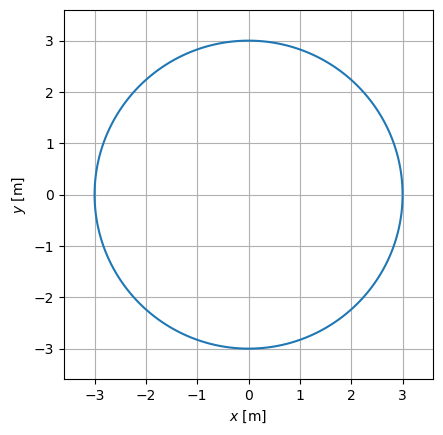

In [4]:

# Erzeuge eine Figure und ein Axes-Objekt.
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('$x$ [m]')
ax.set_ylabel('$y$ [m]')
ax.set_xlim(-1.2 * radius, 1.2 * radius)
ax.set_ylim(-1.2 * radius, 1.2 * radius)
ax.set_aspect('equal')
ax.grid()

# Plotte die Kreisbahn.
plot_bahn, = ax.plot(r[:, 0], r[:, 1])

# Erzeuge einen Punktplot, der die Position der Masse darstellt.
plot_punkt, = ax.plot([], [], 'o', color='blue')

# Erzeuge zwei Textfelder für die Anzeige des aktuellen
# Geschwindigkeits- und Beschleunigungsbetrags.
text_v = ax.text(0, 0.2, '', color='red')
text_a = ax.text(0, -0.2, '', color='black')

# Erzeuge Pfeile für die Geschwindigkeit und die Beschleunigung.
style = mpl.patches.ArrowStyle.Simple(head_length=6,
                                      head_width=3)
pfeil_v = mpl.patches.FancyArrowPatch((0, 0), (0, 0),
                                      color='red',
                                      arrowstyle=style)
pfeil_a = mpl.patches.FancyArrowPatch((0, 0), (0, 0),
                                      color='black',
                                      arrowstyle=style)

# Füge die Grafikobjekte zur Axes hinzu.
ax.add_patch(pfeil_v)
ax.add_patch(pfeil_a)

Die Updatefunktion füllte den plot für jeden Zeitschritt mit der Position, der Geschwindigkeit und der Beschleunigung des bewegten punktes.

In [5]:



def update(n):
    """Aktualisiere die Grafik zum n-ten Zeitschritt."""
    # Setze den Start- und Endpunkt des Geschwindigkeitspfeils
    # und zeige den Geschwindigkeitsbetrag an.
    if n < len(v):
        pfeil_v.set_positions(r[n], r[n] + v[n])
        text_v.set_text(f'$v$ = {np.linalg.norm(v[n]):.3f} m/s')

    # Setze den Start- und Endpunkt des Beschleunigungspfeils
    # und zeige den Beschleunigungsbetrag an.
    if n < len(a):
        pfeil_a.set_positions(r[n], r[n] + a[n])
        text_a.set_text(f'$a$ = {np.linalg.norm(a[n]):.3f} m/s²')

    # Aktualisiere die Position des Punktes.
    plot_punkt.set_data(r[n].reshape(-1, 1))

    return plot_punkt, pfeil_v, pfeil_a, text_a, text_v


# Erzeuge das Animationsobjekt und starte die Animation.
ani = mpl.animation.FuncAnimation(fig, update, frames=t.size,
                                  interval=30, blit=True)
plt.show()

Hier werden die Plots für jeden Zeitschritt zu einem Video zusammmengefügt

In [6]:

from IPython.display import HTML
HTML(ani.to_jshtml())

# Copyright

&copy; Physik mit Python, Oliver Natt, Springer, 2022. <br>
TUM-Studierende haben Zugang zu dem Buch über www.ub.tum.de. 

Copyright (c) 2023 Springer Nature Code Inside

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.